# Get point cloud from Waymo v2 format

In [73]:
#@title Initial setup
from typing import Optional
import warnings
# Disable annoying warnings from PyArrow using under the hood.
warnings.simplefilter(action='ignore', category=FutureWarning)
from platform import python_version
print(python_version())
import numpy as np


import tensorflow as tf
print(tf.__version__)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
import dask.dataframe as dd
from waymo_open_dataset import v2
from waymo_open_dataset.utils import  frame_utils


# Path to the directory with all components
dataset_dir = '/home/wod_v2/src/data/perception_2.0.0/training'
dataset_dir_yolo = '/home/wod_v2/src/data/perception_2.0.0_yolov8'

context_name = '11718898130355901268_2300_000_2320_000'

def read(tag: str) -> dd.DataFrame:
  """Creates a Dask DataFrame for the component specified by its tag."""
  paths = tf.io.gfile.glob(f'{dataset_dir}/{tag}/{context_name}.parquet')
  return dd.read_parquet(paths)



# Lazily read DataFrames for all components.
association_df = read('camera_to_lidar_box_association')
cam_box_df = read('camera_box')
cam_img_df = read('camera_image')
lidar_box_df = read('lidar_box')
lidar_df = read('lidar')
lidar_calibration_df = read('lidar_calibration')

association_df = association_df[association_df['key.camera_name'] == 1]
cam_box_df = cam_box_df[cam_box_df['key.camera_name'] == 1].compute()
cam_img_df = cam_img_df[cam_img_df['key.camera_name'] == 1].compute()
lidar_df = lidar_df[lidar_df['key.laser_name'] == 1]
lidar_calibration_df = lidar_calibration_df[lidar_calibration_df['key.laser_name'] == 1].compute()

# Join all DataFrames using matching columns
cam_image_w_box_df = v2.merge(cam_box_df, cam_img_df)
cam_obj_df = v2.merge(association_df, cam_image_w_box_df, left_nullable=True)
# In this example camera box labels are optional, so we set left_nullable=True.
obj_df = v2.merge(cam_obj_df, lidar_box_df, left_nullable=True, right_nullable=True)
# Group lidar sensors (left), group labels and camera images (right) and join.
df = v2.merge(lidar_df, obj_df, left_group=True, right_group=True)

3.10.14
2.12.0
Num GPUs Available:  1


In [74]:
# Read a single row, which contain data for all data for a single frame.
_, row = next(iter(df.iterrows()))
# Create all component objects
camera_image = v2.CameraImageComponent.from_dict(row)
lidar = v2.LiDARComponent.from_dict(row)
camera_box = v2.CameraBoxComponent.from_dict(row)
lidar_box = v2.LiDARBoxComponent.from_dict(row)
lidar_calibration = v2.LiDARCalibrationComponent.from_dict(lidar_calibration_df)

print(
    f'Found {len(lidar_box.key.laser_object_id)} objects on'
    f' {lidar.key.segment_context_name=} {lidar.key.frame_timestamp_micros=}'
)
for laser_object_id, lidar_box_type, camera_object_id, cam_box_type, camera_name in zip(
    lidar_box.key.laser_object_id,
    lidar_box.type,
    camera_box.key.camera_object_id,
    camera_box.type,
    camera_image.key.camera_name
    # camera_box.key.
):
  print(f'\t{laser_object_id=} {lidar_box_type=} {camera_object_id=} {cam_box_type=} {camera_name=}')

Found 155 objects on lidar.key.segment_context_name='11718898130355901268_2300_000_2320_000' lidar.key.frame_timestamp_micros=1558017561572660
	laser_object_id='L4snb6xvhDhpmIn3mRFNkw' lidar_box_type=2.0 camera_object_id='0104f76d-2d33-43d7-a8d2-33f7a823f305' cam_box_type=2.0 camera_name=1.0
	laser_object_id='OqejN01yv4ROhYelLwjIiA' lidar_box_type=2.0 camera_object_id='0ffc1778-10d2-409d-a4ef-aa5da1f3f7d9' cam_box_type=2.0 camera_name=1.0
	laser_object_id='4rNwARFbwg8i6YohNYeuyQ' lidar_box_type=2.0 camera_object_id='153dc3bb-2b28-4fcd-a3b2-07ce6d515839' cam_box_type=2.0 camera_name=1.0
	laser_object_id='uaHdIUIw7fod02ff8QJmzA' lidar_box_type=nan camera_object_id='1a574afb-db6b-4ccf-87b3-29acb341b274' cam_box_type=2.0 camera_name=1.0
	laser_object_id=nan lidar_box_type=nan camera_object_id='1c1332c3-ba71-4ded-9ab7-158d3057352c' cam_box_type=2.0 camera_name=1.0
	laser_object_id=nan lidar_box_type=nan camera_object_id='2b540647-bfbb-4064-9d99-3e5a9746e237' cam_box_type=1.0 camera_name=1.0

In [75]:
# Get Range image of top lidar
range_image_orig = lidar.range_image_return1

range_image = v2.perception.lidar.RangeImage(lidar.range_image_return1.values[0], lidar.range_image_return1.shape[0])

print(range_image)
print(type(range_image.values))
print(range_image.shape)

temp_tfm = v2.column_types.Transform
temp_tfm.transform = lidar_calibration.extrinsic.transform.tolist()[0]
temp_bic = v2.perception.context.BeamInclination
temp_bic.min = lidar_calibration.beam_inclination.min
temp_bic.max = lidar_calibration.beam_inclination.max
temp_bic.values = lidar_calibration.beam_inclination.values.tolist()[0]

lc2 = v2.perception.context.LiDARCalibrationComponent(lidar_calibration.key, temp_tfm, temp_bic)

print(lidar_calibration.extrinsic.transform.tolist()[0])
print(type(lidar_calibration.extrinsic))
print(type(lidar_calibration.extrinsic.transform))
print(type(lidar_calibration_df))
print(type(lidar_calibration))
# extrinsic = tf.convert_to_tensor(lidar_calibration.extrinsic.transform)

# TODO: Eventually should add pixel_pose and frame_pose when mulitple cameras are used
points = v2.perception.utils.lidar_utils.convert_range_image_to_point_cloud(range_image, lc2, keep_polar_features=True)


RangeImage(values=array([-1., -1., -1., ..., -1., -1., -1.], dtype=float32), shape=array([  64, 2650,    4], dtype=int32))
<class 'numpy.ndarray'>
[  64 2650    4]
[-8.50125289e-01 -5.26574882e-01  2.42619623e-03  1.43000000e+00
  5.26578914e-01 -8.50124957e-01  1.48508379e-03  0.00000000e+00
  1.28056215e-03  2.54009106e-03  9.99995954e-01  2.18400000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]
<class 'waymo_open_dataset.v2.column_types.Transform'>
<class 'pandas.core.series.Series'>
<class 'pandas.core.frame.DataFrame'>
<class 'waymo_open_dataset.v2.perception.context.LiDARCalibrationComponent'>


In [4]:
print(points.shape)
print(points[:,4])

(146243, 6)
tf.Tensor([ 4.7047043 13.694003  13.926867  ... -1.7749571 -1.7840252 -1.7381428], shape=(146243,), dtype=float32)


# Pipeline to yolo bev format

In [7]:
import cv2
import numpy as np


# create birds-eye view of lidar data
def bev_from_pcl(lidar_pcl, configs, viz=False, verbose=False):
    # remove lidar points outside detection area and with too low reflectivity
    mask = np.where((lidar_pcl[:, POINTCLOUD_X_INDEX] >= configs['lim_x'][0]) & (lidar_pcl[:, POINTCLOUD_X_INDEX] <= configs['lim_x'][1]) &
                    (lidar_pcl[:, POINTCLOUD_Y_INDEX] >= configs['lim_y'][0]) & (lidar_pcl[:, POINTCLOUD_Y_INDEX] <= configs['lim_y'][1]))# &
                    #(lidar_pcl[:, POINTCLOUD_Z_INDEX] >= configs['lim_z'][0]) & (lidar_pcl[:, POINTCLOUD_Z_INDEX] <= configs['lim_z'][1]))
    lidar_pcl = lidar_pcl[mask]
    
    # shift level of ground plane to avoid flipping from 0 to 255 for neighboring pixels
    lidar_pcl[:, POINTCLOUD_Z_INDEX] = lidar_pcl[:, POINTCLOUD_Z_INDEX] - configs['lim_z'][0]  

    if verbose:
        print(lidar_pcl[0,:])
        print('Min and max height, %f, %f' %(np.min(lidar_pcl[:,2]), np.max(lidar_pcl[:,2])))

    # convert sensor coordinates to bev-map coordinates (center is bottom-middle)

    ## step 1 : compute bev-map discretization by dividing x-range by the bev-image height (see configs)
    delta_x_rw_meters = configs['lim_x'][1] - configs['lim_x'][0]
    delta_y_rw_meters = configs['lim_y'][1] - configs['lim_y'][0]
    meters_pixel_x = delta_x_rw_meters / configs['bev_height']
    meters_pixel_y = delta_y_rw_meters / configs['bev_width']

    ## step 2 : create a copy of the lidar pcl and transform all metrix x-coordinates into bev-image coordinates  
    lidar_pcl_copy = np.copy(lidar_pcl)
    lidar_pcl_copy[:, POINTCLOUD_X_INDEX] = np.int_(np.floor(lidar_pcl_copy[:, POINTCLOUD_X_INDEX] / meters_pixel_x))  

    # step 3 : perform the same operation as in step 2 for the y-coordinates but make sure that no negative bev-coordinates occur
    lidar_pcl_copy[:, POINTCLOUD_Y_INDEX] = np.int_(np.floor(lidar_pcl_copy[:, POINTCLOUD_Y_INDEX] / meters_pixel_y) + (configs['bev_width'] + 1) / 2)

    # step 4 : visualize point-cloud using the function show_pcl from a previous task
    # if viz:
    #     show_pcl(lidar_pcl_copy)
   
   
    # Compute intensity layer of the BEV map

    ## step 1 : create a numpy array filled with zeros which has the same dimensions as the BEV map
    intensity_map = np.zeros((configs['bev_height'] + 1, configs['bev_width'] + 1))

    # step 2 : re-arrange elements in lidar_pcl_cpy by sorting first by x, then y, then -z (use numpy.lexsort)
    lidar_pcl_copy[lidar_pcl_copy[:, POINTCLOUD_INTENSITY] > 1.0, POINTCLOUD_INTENSITY] = 1.0
    index_vector_int = np.lexsort((-lidar_pcl_copy[:, POINTCLOUD_INTENSITY], lidar_pcl_copy[:, POINTCLOUD_Y_INDEX], lidar_pcl_copy[:, POINTCLOUD_X_INDEX]))
    lidar_pcl_top = lidar_pcl_copy[index_vector_int]

    ## step 3 : extract all points with identical x and y such that only the top-most z-coordinate is kept (use numpy.unique)
    ##          also, store the number of points per x,y-cell in a variable named "counts" for use in the next task
    _, idx_int_unique, counts = np.unique(lidar_pcl_top[:, POINTCLOUD_X_INDEX:POINTCLOUD_Z_INDEX], return_index=True, return_inverse=False, return_counts=True, axis=0)
    lidar_pcl_top = lidar_pcl_top[idx_int_unique]

    intensity_map = np.zeros((configs['bev_height'] + 1, configs['bev_width'] + 1))
    
    ## step 4 : assign the intensity value of each unique entry in lidar_pcl_top to the intensity map 
    ##          make sure that the intensity is scaled in such a way that objects of interest (e.g. vehicles) are clearly visible    
    ##          also, make sure that the influence of outliers is mitigated by normalizing intensity on the difference between the max. and min. value within the point cloud
    intensity_map[np.int_(lidar_pcl_top[:, POINTCLOUD_X_INDEX]), np.int_(lidar_pcl_top[:, POINTCLOUD_Y_INDEX])] = lidar_pcl_top[:, POINTCLOUD_INTENSITY] / (np.amax(lidar_pcl_top[:, POINTCLOUD_INTENSITY]) - np.amin(lidar_pcl_top[:, POINTCLOUD_INTENSITY]))

    # if viz:
    #     analyze({'before': lidar_pcl_top_copy, 'after': lidar_pcl_top_copy_post}, title='Intensity Distribution', nqp=False)

    ## step 5 : temporarily visualize the intensity map using OpenCV to make sure that vehicles separate well from the background
    img_intensity = intensity_map * 255
    img_intensity = img_intensity.astype(np.uint8)
    if viz:
        while (1):
            cv2.imshow('img_intensity', img_intensity)
            if cv2.waitKey(10) & 0xFF == 27:
                break
        cv2.destroyAllWindows

   

    # Compute height layer of the BEV map

    ## step 1 : create a numpy array filled with zeros which has the same dimensions as the BEV map
    height_map = np.zeros((configs['bev_height'] + 1, configs['bev_width'] + 1))

    ## step 2 : assign the height value of each unique entry in lidar_top_pcl to the height map
    ##          make sure that each entry is normalized on the difference between the upper and lower height defined in the config file
    ##          use the lidar_pcl_top data structure from the previous task to access the pixels of the height_map
    # _, idx_height_unique, counts = np.unique(lidar_pcl_top[:, 0:2], return_index=True, return_inverse=False, return_counts=True, axis=0)
    # lidar_pcl_hei = lidar_pcl_top[idx_height_unique]
    height_map[np.int_(lidar_pcl_top[:, POINTCLOUD_X_INDEX]), np.int_(lidar_pcl_top[:, POINTCLOUD_Y_INDEX])] = lidar_pcl_top[:, POINTCLOUD_Z_INDEX] / float(np.abs(configs['lim_z'][1] - configs['lim_z'][0]))

    ## step 3 : temporarily visualize the intensity map using OpenCV to make sure that vehicles separate well from the background
    img_height = height_map * 256
    img_height = img_height.astype(np.uint8)
    if viz:
        while (1):
            cv2.imshow('img_height', img_height)
            if cv2.waitKey(10) & 0xFF == 27:
                break
        cv2.destroyAllWindows

    #######
    ####### ID_S2_EX3 END #######       

    # TODO remove after implementing all of the above steps
    # lidar_pcl_cpy = []
    # lidar_pcl_top = []
    # height_map = []
    # intensity_map = []

    # Compute density layer of the BEV map


    density_map = np.zeros((configs['bev_height'] + 1, configs['bev_width'] + 1))
    _, _, counts = np.unique(lidar_pcl_copy[:, POINTCLOUD_X_INDEX:POINTCLOUD_Z_INDEX], axis=0, return_index=True, return_counts=True)
    normalizedCounts = np.minimum(1.0, np.log(counts + 1) / np.log(64)) 
    density_map[np.int_(lidar_pcl_top[:, POINTCLOUD_X_INDEX]), np.int_(lidar_pcl_top[:, POINTCLOUD_Y_INDEX])] = normalizedCounts

    
    if viz:
        while (1):
            cv2.imshow('density map', density_map)
            if cv2.waitKey(10) & 0xFF == 27:
                break
        cv2.destroyAllWindows
    
    # assemble 3-channel bev-map from individual maps
    bev_map = np.zeros((3, configs['bev_height'], configs['bev_width']))
    bev_map[2, :, :] = density_map[:configs['bev_height'], :configs['bev_width']]  # r_map
    bev_map[1, :, :] = height_map[:configs['bev_height'], :configs['bev_width']]  # g_map
    bev_map[0, :, :] = intensity_map[:configs['bev_height'], :configs['bev_width']]  # b_map
   

    # expand dimension of bev_map before converting into a tensor
    s1, s2, s3 = bev_map.shape
    bev_maps = np.zeros((1, s1, s2, s3))
    bev_maps[0] = bev_map

    if viz: 
        bev_map_cpy = np.zeros((configs['bev_height'], configs['bev_width'], 3))
        bev_map_cpy[:, :, 2] = density_map[:configs['bev_height'], :configs['bev_width']] /  density_map.max() # r_map
        bev_map_cpy[:, :, 1] = height_map[:configs['bev_height'], :configs['bev_width']] / height_map.max() # g_map
        bev_map_cpy[:, :, 0] = intensity_map[:configs['bev_height'], :configs['bev_width']] / intensity_map.max() # b_map
        print(bev_map_cpy.shape)
        # bev_map_cpy = np.reshape(bev_map, (bev_map.shape[1], bev_map.shape[2], bev_map.shape[0]))
        print( intensity_map.max(), height_map.max(), density_map.max())
        while (1):
            cv2.imshow('bev_map', bev_map_cpy)
            if cv2.waitKey(10) & 0xFF == 27:
                break
        cv2.destroyAllWindows
    # bev_maps = torch.from_numpy(bev_maps)  # create tensor from birds-eye view
    # input_bev_maps = bev_maps.to(configs[device], non_blocking=True).float()

    # show_bev(input_bev_maps, configs)

    return bev_maps

In [38]:
# Get bev_map

configs = {}
configs['lim_x'] = [0,53]
configs['lim_y'] = [-20,20]
configs['lim_z'] = [-3.1, 2]
configs['lim_r'] = [0, 1.0]
configs['bev_height'] = 640
configs['bev_width'] = 480

# points_xyzl = points[:, :4]
# points_xyzl[:, :2] = points[:, 3:5]
# points_xyzl[:, 3] = points[:, 1]
POINTCLOUD_X_INDEX = 3
POINTCLOUD_Y_INDEX = 4
POINTCLOUD_Z_INDEX = 5
POINTCLOUD_INTENSITY = 1
# print(points_xyzl[:, POINTCLOUD_Z_INDEX].min(), ' ', points_xyzl[:, POINTCLOUD_Z_INDEX].max())

points_cpu = points.numpy()
bev_map = bev_from_pcl(points_cpu, configs, viz=False)

# The bev_map is not in the correct format
bev_map_cpy = np.zeros((configs['bev_height'], configs['bev_width'], 3))
bev_map_cpy[:, :, 2] = bev_map[0,2,:configs['bev_height'], :configs['bev_width']] / bev_map[0,2,:,:].max() # r_map
bev_map_cpy[:, :, 1] = bev_map[0,1,:configs['bev_height'], :configs['bev_width']] / bev_map[0,1,:,:].max() # g_map
bev_map_cpy[:, :, 0] = bev_map[0,0,:configs['bev_height'], :configs['bev_width']] / bev_map[0,0,:,:].max() # b_map

bev_map_cpy[:,:,0] = bev_map_cpy[:,:,0] * 255 / bev_map_cpy[:,:,0].max()
bev_map_cpy[:,:,1] = bev_map_cpy[:,:,1] * 255 / bev_map_cpy[:,:,1].max()
bev_map_cpy[:,:,2] = bev_map_cpy[:,:,2] * 255 / bev_map_cpy[:,:,2].max()
print(bev_map.shape)
print(bev_map_cpy.shape)
print(bev_map_cpy[:,:,0].max())
print(bev_map_cpy[:,:,1].max())
print(bev_map_cpy[:,:,2].max())

(1, 3, 640, 480)
(640, 480, 3)
255.0
255.0
255.0


# Visualizations

## Helper

In [9]:
def rotate_mtx(points, angle, center):
    rotation = np.array([[np.cos(angle), -np.sin(angle)],[np.sin(angle), np.cos(angle)]])
    p = points - center
    p = p.dot(rotation)
    # print(p.shape)
    return p + center
    

def distance_to_pixel(box):
    w_ = configs['bev_height'] / (configs['lim_x'][1] - configs['lim_x'][0])
    l_ = configs['bev_width'] / (configs['lim_y'][1] - configs['lim_y'][0])
    x1 = (box[0] - box[2] / 2 - configs['lim_x'][0]) * w_
    x2 = (box[0] + box[2] / 2 - configs['lim_x'][0]) * w_
    y1 = (box[1] - box[3] / 2 - configs['lim_y'][0]) * l_
    y2 = (box[1] + box[3] / 2 - configs['lim_y'][0]) * l_
    # points = np.array([[x1,y1],[x2,y1],[x1,y2],[x2,y2]])
    return np.array([[y1,x1],[y1,x2],[y2,x2],[y2,x1]])
    # return rotate(points, box[4])
    
    # points = np.array([x1,y1,x2,y2]).astype(int)
    # return points

def distance_to_pixel2(box):
    w_ = configs['bev_height'] / (configs['lim_x'][1] - configs['lim_x'][0])
    l_ = configs['bev_width'] / (configs['lim_y'][1] - configs['lim_y'][0])
    x1 = (box[0] - box[2] / 2 - configs['lim_x'][0]) * w_
    x2 = (box[0] + box[2] / 2 - configs['lim_x'][0]) * w_
    y1 = (box[1] - box[3] / 2 - configs['lim_y'][0]) * l_
    y2 = (box[1] + box[3] / 2 - configs['lim_y'][0]) * l_
    # points = np.array([[x1,y1],[x2,y1],[x1,y2],[x2,y2]])
    # return np.array([[y1,x1],[y1,x2],[y2,x2],[y2,x1]])
    # return rotate(points, box[4])
    
    points = np.array([x1,y1,x2,y2]).astype(int)
    return points

colors = [(0,100,100),(100,100,0), (100, 0, 100), (25,25,100), (25,100,25), (100,25,25)] #  Cyclists, Vehicles, Pedestrians, Signs

def show_image_cv2(img, boxes):
    for box in boxes:
        # print("x: ", box[0], " y: ", box[1], " w: ", box[2], " l: ", box[3])
        xyxy = distance_to_pixel(box[1:])
        # print("xy top left: ", xyxy[0], " xy bottom right: ", xyxy[2])
        # cv2.rectangle(bev_map_cpy, (int(xyxy[0][0]), int(xyxy[0][1]), int(xyxy[2][0]), int(xyxy[2][1])), thickness=2, color=(100,0,100))
        # xyxy2 = distance_to_pixel2(box)
        # cv2.rectangle(bev_map_cpy, (int(xyxy2[1]), int(xyxy2[0])), (int(xyxy2[3]), int(xyxy2[2])), thickness=2, color=(100,0,100))
    
        
        c = ((box[1] - configs['lim_x'][0]) * configs['bev_height'] / (configs['lim_x'][1] - configs['lim_x'][0]), 
             (box[2] - configs['lim_y'][0]) * configs['bev_width'] / (configs['lim_y'][1] - configs['lim_y'][0]))
        rotated = rotate_mtx(xyxy, box[5], (c[1],c[0]))
        cv2.drawContours(img, [rotated.astype(int)], -1, thickness=2, color=colors[int(box[0])])
        # cv2.putText(bev_map, names[int(cls)], (int(xyxy[0]), int(xyxy[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color=(100,100,0), thickness=2)
    
    tmp = 0
    while (1): 
        rotated = rotate_mtx(xyxy, tmp, (c[1],c[0]))
        # cv2.drawContours(bev_map_cpy, [rotated.astype(int)], -1, thickness=2, color=(100,100,0))
        cv2.imshow('bev_map2', img)
        tmp = tmp + 0.5
        if cv2.waitKey(10) & 0xFF == 27:
            break
    cv2.destroyAllWindows

In [82]:
import matplotlib.pyplot as plt
from matplotlib import patches
import pandas as pd

colors_cam = [(100.0,100.0,0.0),    # Unknown
              (0.0,100.0,100.0),    # Vehicle
              (100.0, 0.0, 100.0),  # Pedestrian
              (255.0,0.0,0.0),      # Sign
              (25.0,100.0,25.0)]    # Cyclist
box_list_size = 5

def show_image(img, boxes):
    # img: jpg image
    # camera_box_: a box as the following list [class, cx, cy, w, h]
    
    plt.figure(figsize=(25, 20))
    
    """Display the given camera image."""
    ax = plt.subplot(*[1,1,1])
    plt.imshow(img)
    # plt.title(open_dataset.CameraName.Name.Name(camera_image_.name))
    plt.grid(False)
    plt.axis('off')

    nans = []
    for i, box in enumerate(boxes):
        
        if len(box) <= box_list_size:
            angle=0
        else:
            angle=box[5]
        if not pd.isnull(box[0]) and int(box[0]) < len(colors_cam):
            edgecolor=(np.array(colors_cam[int(box[0])])/255.0, 1.0)
            facecolor=(np.array(colors_cam[int(box[0])])/255.0, 0.1)
        else:
            nans.append(i)
            edgecolor = (0.0, 1.0, 0.0, 1.0)
            facecolor = (0.0, 1.0, 0.0, 0.1)
        # Draw the bounding box.
        rect = patches.Rectangle(
            xy=((box[1] - box[3] / 2),
                (box[2] - box[4] / 2)),
            width=box[3],
            height=box[4],
            angle=angle,
            rotation_point='center',
            linewidth=3,
            edgecolor=edgecolor,  # green
            facecolor=facecolor)  # opaque green
        ax.add_patch(rect)
    print(f'Indexes of nan objects: {nans}')


## Visualizations

In [70]:
# Get lidar boxes and convert to image space

def rotate_lidar_boxes(lidar_boxes):
        return np.transpose(np.array([
            lidar_boxes[:, 0],
            lidar_boxes[:, 2],
            lidar_boxes[:, 1],
            lidar_boxes[:, 4],
            lidar_boxes[:, 3],
            lidar_boxes[:, 5]]))

def lidar_boxes_to_image_space(lidar_box, configs, rotated=False):
    if rotated:
        flip_y=-1.0
    else:
        flip_y=1.0
    POINTCLOUD_X_INDEX = 1
    POINTCLOUD_Y_INDEX = 2
    lidar_boxes = np.transpose(np.array([
        np.array(lidar_box.type),
        ((np.array(lidar_box.box.center.y) * flip_y) - configs['lim_y'][0]) * configs['bev_width'] / (configs['lim_y'][1] - configs['lim_y'][0]), 
        (np.array(lidar_box.box.center.x) - configs['lim_x'][0]) * configs['bev_height'] / (configs['lim_x'][1] - configs['lim_x'][0]), 
        np.array(lidar_box.box.size.y) * configs['bev_width'] / (configs['lim_y'][1] - configs['lim_y'][0]), 
        np.array(lidar_box.box.size.x) * configs['bev_height'] / (configs['lim_x'][1] - configs['lim_x'][0]) , 
        np.array(lidar_box.box.heading) * -180.0 / np.pi]))
    
    # # Remove labels outside the image
    # mask = np.where((lidar_boxes[:, POINTCLOUD_X_INDEX] >= 0) & (lidar_boxes[:, POINTCLOUD_X_INDEX] <= configs['bev_width']) &
    #                 (lidar_boxes[:, POINTCLOUD_Y_INDEX] >= 0) & (lidar_boxes[:, POINTCLOUD_Y_INDEX] <= configs['bev_height']))# &
    #                 #(lidar_pcl[:, POINTCLOUD_Z_INDEX] >= configs['lim_z'][0]) & (lidar_pcl[:, POINTCLOUD_Z_INDEX] <= configs['lim_z'][1]))
    # lidar_boxes = lidar_boxes[mask]
    
    # Prune nan
    # lidar_boxes = lidar_boxes[~np.isnan(lidar_boxes).any(axis=1)]

    if rotated:
        lidar_boxes = rotate_lidar_boxes(lidar_boxes)
    
    return lidar_boxes

def camera_boxes_to_image_space(camera_box, normalized=None):
    if normalized is None:
        normalized = (1.0, 1.0)
    camera_boxes = np.transpose(np.array([
        np.array(camera_box.type),
        np.array(camera_box.box.center.x) / normalized[1], 
        np.array(camera_box.box.center.y) / normalized[0], 
        np.array(camera_box.box.size.x) / normalized[1], 
        np.array(camera_box.box.size.y) / normalized[0]]))
    # Prune nan
    # return camera_boxes[~np.isnan(camera_boxes).any(axis=1)]
    return camera_boxes

def remove_labels_outside_bev(lidar_boxes, camera_boxes, configs):
    POINTCLOUD_X_INDEX = 1
    POINTCLOUD_Y_INDEX = 2
    # Remove labels outside the image
    mask = np.where((lidar_boxes[:, POINTCLOUD_X_INDEX] >= 0) & (lidar_boxes[:, POINTCLOUD_X_INDEX] <= configs['bev_width']) &
                    (lidar_boxes[:, POINTCLOUD_Y_INDEX] >= 0) & (lidar_boxes[:, POINTCLOUD_Y_INDEX] <= configs['bev_height']))# &
                    #(lidar_pcl[:, POINTCLOUD_Z_INDEX] >= configs['lim_z'][0]) & (lidar_pcl[:, POINTCLOUD_Z_INDEX] <= configs['lim_z'][1]))
    lidar_boxes = lidar_boxes[mask]
    camera_boxes = camera_boxes[mask]
    
    # lidar_boxes = lidar_boxes[~np.isnan(lidar_boxes).any(axis=1)]
    # camera_boxes = camera_boxes[~np.isnan(camera_boxes).any(axis=1)]
    return lidar_boxes, camera_boxes

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


255.0
255.0
255.0
Indexes of nan objects: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 30, 31, 47, 50, 52]


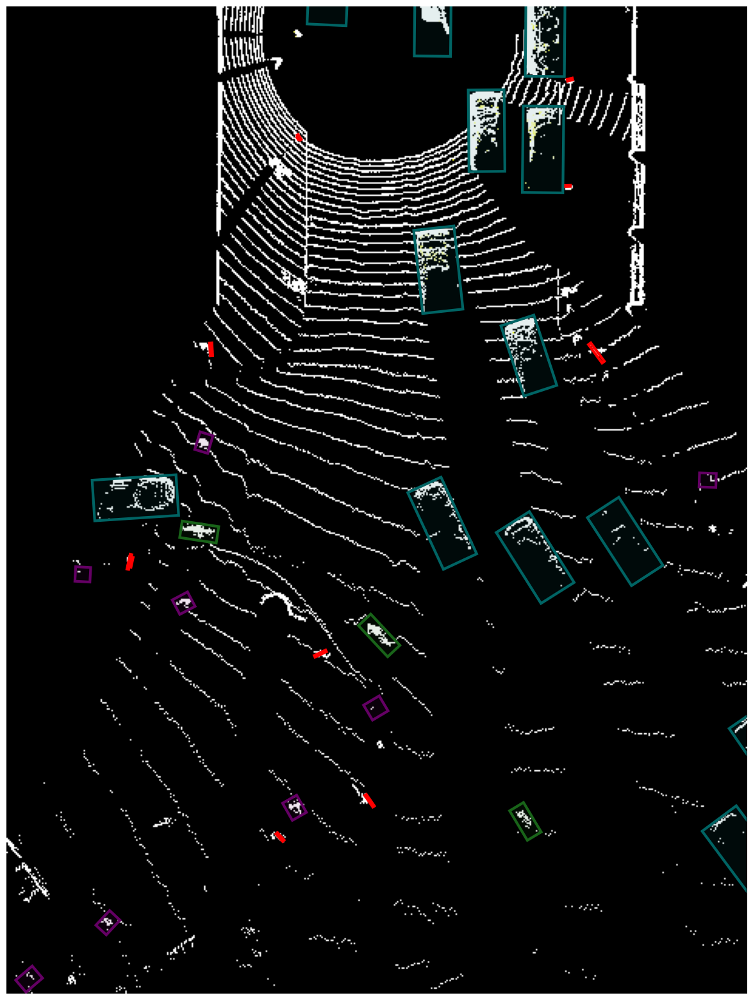

In [83]:
# The image data are float in the range 0-255, so mathplotlib clipps the data
lidar_box_masked = lidar_boxes_to_image_space(lidar_box, configs, rotated=False)
print(bev_map_cpy[:,:,0].max())
print(bev_map_cpy[:,:,1].max())
print(bev_map_cpy[:,:,2].max())


bev_map_cpy2 = np.zeros((configs['bev_height'], configs['bev_width'], 3))
bev_map_cpy2[:,:,0] = bev_map_cpy[:,:,2]
bev_map_cpy2[:,:,1] = bev_map_cpy[:,:,1]
bev_map_cpy2[:,:,2] = bev_map_cpy[:,:,0]

show_image(bev_map_cpy2, lidar_box_masked)

255.0
255.0
255.0
(640, 480, 3)
Indexes of nan objects: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 30, 31, 47, 50, 52]


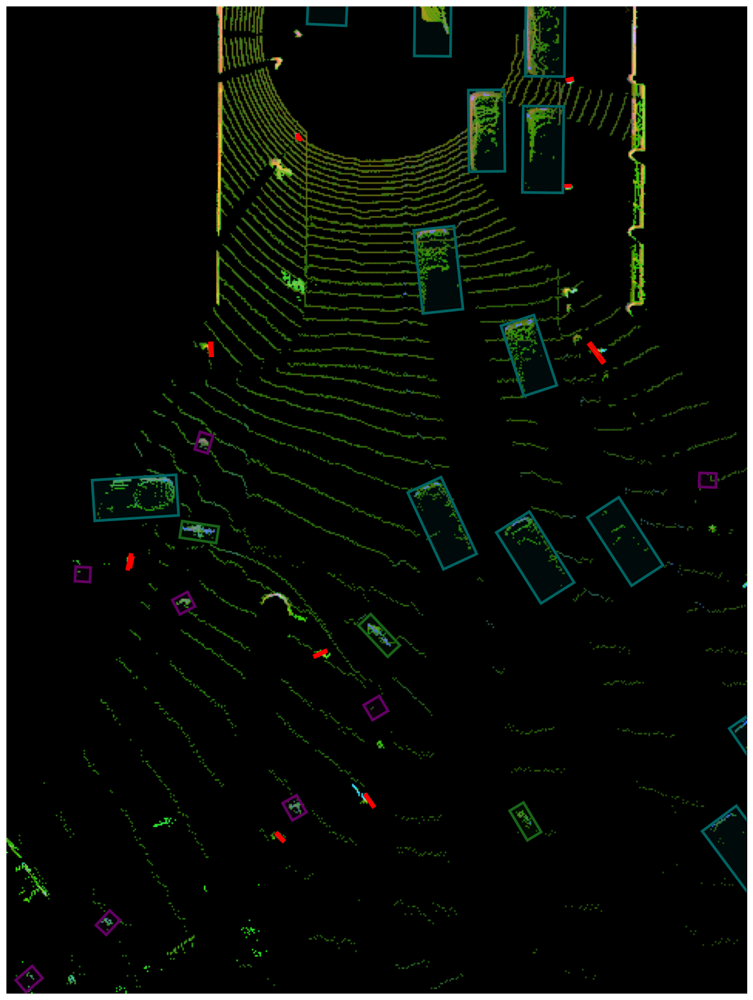

In [84]:
# Here each pixel is convert to int so it can be read properly by matplotlib. Some color values are also swapped. 
# There really is no reason to swap but i was using cv2 and it uses a different color scheme.
lidar_box_masked = lidar_boxes_to_image_space(lidar_box, configs, rotated=False)
print(bev_map_cpy[:,:,0].max())
print(bev_map_cpy[:,:,1].max())
print(bev_map_cpy[:,:,2].max())


bev_map_cpy2 = np.zeros((configs['bev_height'], configs['bev_width'], 3))
bev_map_cpy2[:,:,0] = bev_map_cpy[:,:,2]
bev_map_cpy2[:,:,1] = bev_map_cpy[:,:,1]
bev_map_cpy2[:,:,2] = bev_map_cpy[:,:,0]
bev_map_cpy2 = np.round(bev_map_cpy2).astype(int)
print(bev_map_cpy2.shape)

show_image(bev_map_cpy2, lidar_box_masked)

(640, 480, 3)
(480, 640, 3)
(155, 6)
Indexes of nan objects: [3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 30, 31, 47, 50, 52]


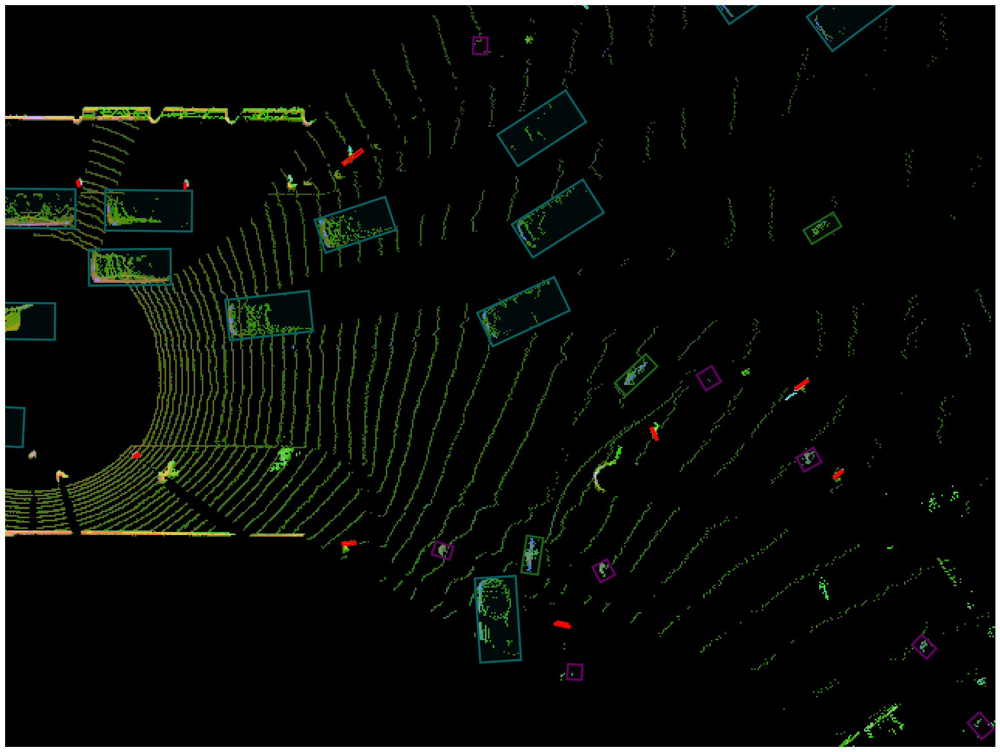

In [85]:
# The bev resolution is almost the same as the camera image, but the height and width are swapped. 
# The bev is rotated to match closer to the image

lidar_box_rotated = lidar_boxes_to_image_space(lidar_box, configs, rotated=True)
print(bev_map_cpy2.shape)
bev_map_rotated = np.rot90(bev_map_cpy2)
print(bev_map_rotated.shape)
print(lidar_box_rotated.shape)

show_image(bev_map_rotated, lidar_box_rotated)

Using img:  0
(1280, 1920, 3)
Box size:  (155, 5)
(155, 5)
255
44
Indexes of nan objects: [55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154]


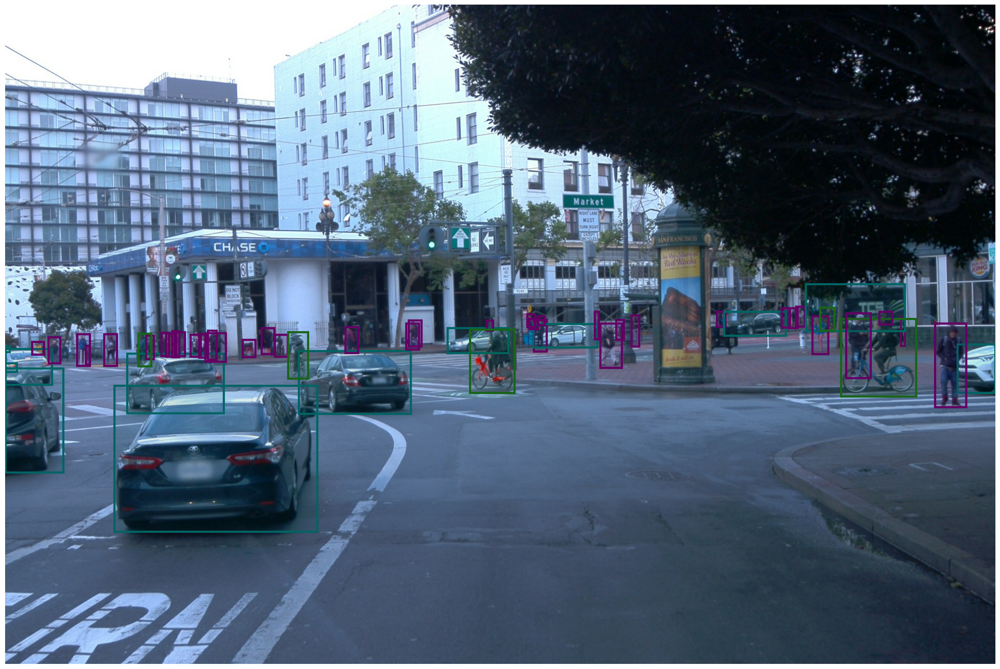

In [86]:
# Find image that is not nan
img_index = 0

while img_index < len(lidar_box.key.laser_object_id) and pd.isnull(camera_image.image[img_index]):
    img_index = img_index + 1
print("Using img: ", img_index)
img0 = tf.image.decode_jpeg(camera_image.image[img_index])
waymo_img_shape = img0.get_shape()
print(img0.get_shape())
    
c_box = camera_boxes_to_image_space(camera_box)
print('Box size: ', c_box.shape)
print(c_box.shape)

print(img0[:,:,0].numpy().max())
print(camera_image.image[img_index][1000])
show_image(img0, c_box)

(33, 6)
(33, 5)
Indexes of nan objects: [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32]


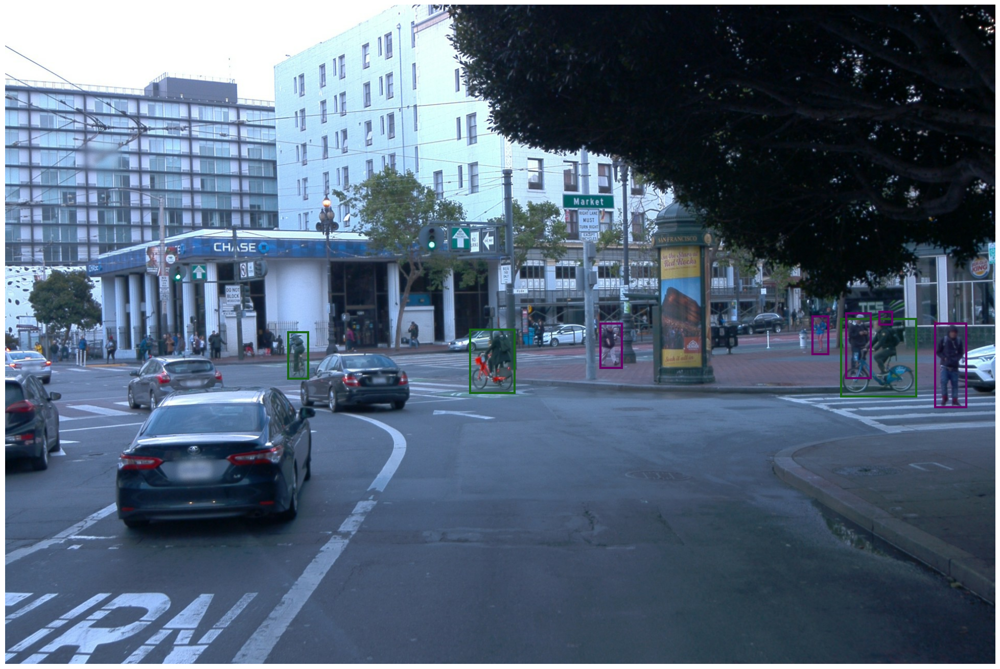

In [87]:
# As of now, the lidar and camera boxes have a different number of objects in them.
# This removes objects from both camera and lidar if they are outside bev frame
lidar_boxes = lidar_boxes_to_image_space(lidar_box, configs)
camera_boxes = camera_boxes_to_image_space(camera_box)
lidar_boxes, camera_boxes = remove_labels_outside_bev(lidar_boxes, camera_boxes, configs)
print(lidar_boxes.shape)
print(camera_boxes.shape)

show_image(img0, camera_boxes)

In [ ]:
# Remove both camera and lidar objects that are not in the lidar bounds

c_box = camera_boxes_to_image_space(camera_box)


(428, 640, 3)
[58.0, 332.30016, 193.079788, 254.88, 324.12012]
[75.0, 320.76032, 253.435064, 166.4, 195.25017599999998]


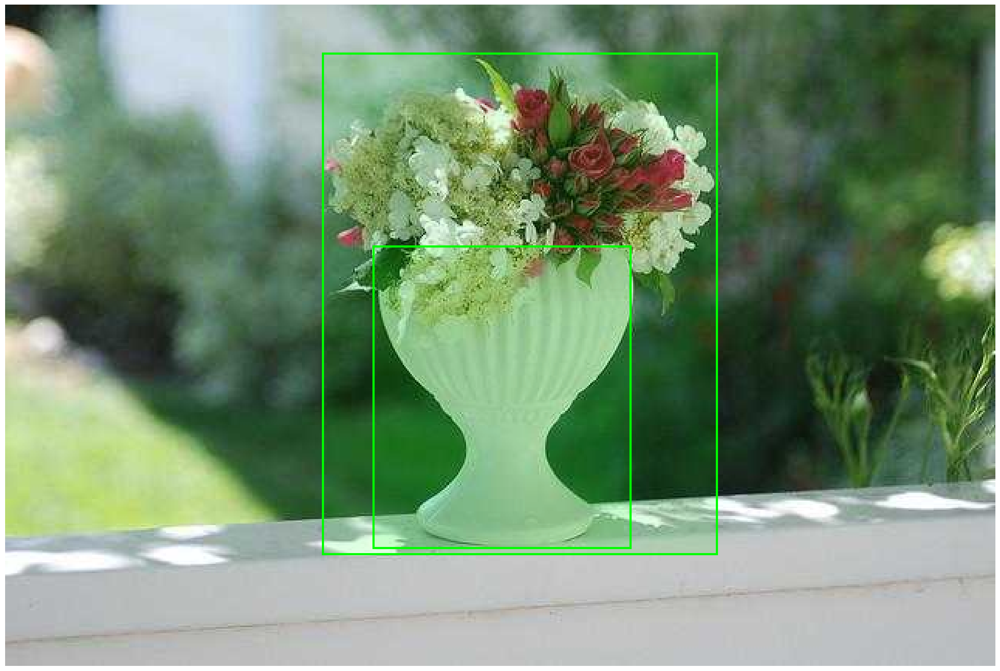

In [13]:
# Visualize coco8
import matplotlib.image as mpimg
from matplotlib import patches

dataset_coco8_img = '/home/wod_v2/src/datasets/coco8/images/train/000000000030.jpg'
dataset_coco8_labels = '/home/wod_v2/src/datasets/coco8/labels/train/000000000030.txt'
coco8_img = mpimg.imread(dataset_coco8_img)
theta_obb_format_len = 5
print(coco8_img.shape)

def read_boxes(filename, img):
    boxes = []
    with open(filename, 'r') as coco8_lbs_file:
        for line in coco8_lbs_file:
            line = [float(i) for i in line.split()]
            if len(line) == theta_obb_format_len and not pd.isnull(line[0]):
                line[1] = line[1] * img.shape[1]
                line[2] = line[2] * img.shape[0]
                line[3] = line[3] * img.shape[1]
                line[4] = line[4] * img.shape[0]
                boxes.append(line)
    return boxes

coco8_boxes = read_boxes(dataset_coco8_labels, coco8_img)
show_image(coco8_img, coco8_boxes)



In [79]:
# No need anymore
bev_map_cv2 = bev_map_cpy.copy()
print(bev_map_cv2.shape)
# show_image_cv2(bev_map_cv2, lidar_box_masked)

(640, 480, 3)


# Pipeline for Yolov8

## Save camera and lidar data

In [33]:
# Save data in yolov8 format
import os
import cv2
import matplotlib.image as mpimg

dataset_dir_yolo = '/home/wod_v2/src/data/perception_2.0.0_yolov8'
print(camera_image.key.segment_context_name)
filename = f'{camera_image.key.segment_context_name}:{camera_image.key.frame_timestamp_micros}'
path_img = os.path.join(dataset_dir_yolo, 'images', 'training', f'{filename}cam.jpg')
path_lidar = os.path.join(dataset_dir_yolo, 'images', 'training', f'{filename}lidar.jpg')
path_lbs = os.path.join(dataset_dir_yolo, 'labels', 'training', f'{filename}.txt')
img_to_save = camera_image.image[img_index]


bev_map = bev_from_pcl(points_cpu, configs, viz=False)
bev_map_cpy = np.zeros((configs['bev_height'], configs['bev_width'], 3))
bev_map_cpy[:, :, 2] = bev_map[0,2,:configs['bev_height'], :configs['bev_width']] / bev_map[0,2,:,:].max() # r_map
bev_map_cpy[:, :, 1] = bev_map[0,1,:configs['bev_height'], :configs['bev_width']] / bev_map[0,1,:,:].max() # g_map
bev_map_cpy[:, :, 0] = bev_map[0,0,:configs['bev_height'], :configs['bev_width']] / bev_map[0,0,:,:].max() # b_map
bev_map_cpy[:,:,0] = bev_map_cpy[:,:,0] * 255 / bev_map_cpy[:,:,0].max()
bev_map_cpy[:,:,1] = bev_map_cpy[:,:,1] * 255 / bev_map_cpy[:,:,1].max()
bev_map_cpy[:,:,2] = bev_map_cpy[:,:,2] * 255 / bev_map_cpy[:,:,2].max()
bev_map_cpy2 = np.zeros((configs['bev_height'], configs['bev_width'], 3))
bev_map_cpy2[:,:,0] = bev_map_cpy[:,:,2]
bev_map_cpy2[:,:,1] = bev_map_cpy[:,:,1]
bev_map_cpy2[:,:,2] = bev_map_cpy[:,:,0]
bev_map_cpy2 = np.round(bev_map_cpy2).astype(np.uint8)
bev_map_rotated = np.rot90(bev_map_cpy2)


print(type(camera_box.type))

with open(path_img, 'wb') as jpg:
    jpg.write(img_to_save)
    
mpimg.imsave(path_lidar, bev_map_rotated)

# build combined label
camera_boxes = dataframe_to_2d_array(camera_box)
lidar_boxes_rotated = lidar_boxes_to_image_space(lidar_box, configs, rotated=True)
print(camera_boxes[:,0].shape)
print(lidar_boxes_rotated[:,3].shape)

boxes_combined = np.transpose(np.stack(np.array([
    camera_boxes[:,0],
    camera_boxes[:,1],
    camera_boxes[:,2],
    camera_boxes[:,3],
    camera_boxes[:,4],
    lidar_boxes_rotated[:,1],
    lidar_boxes_rotated[:,2],
    lidar_boxes_rotated[:,3],
    lidar_boxes_rotated[:,4],
    lidar_boxes_rotated[:,5]
])))
print(boxes_combined.shape)

def write_2d_array_to_file(array, filename):
    with open(filename, 'w') as file:
        for inner_array in array:
            if len(inner_array) == theta_obb_format_len and not pd.isnull(inner_array[0]):
                line = ' '.join(map(str, inner_array))
                file.write(line + '\n')

converted_boxes = dataframe_to_2d_array(camera_box, waymo_img_shape)
write_2d_array_to_file(converted_boxes, path_lbs)

11718898130355901268_2300_000_2320_000
<class 'list'>
(55,)
(33,)


/tmp/ipykernel_1061/3194952608.py:44: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  boxes_combined = np.transpose(np.stack(np.array([


ValueError: all input arrays must have the same shape

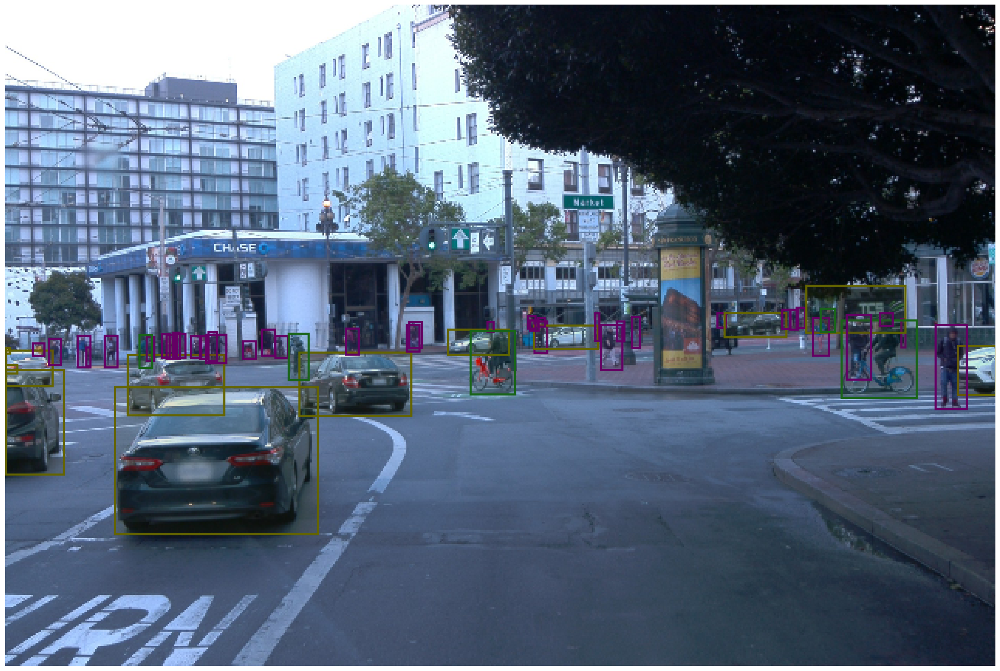

In [12]:
# Visualize data just saved
waymo_to_yolo_img = mpimg.imread(path_img)
waymo_to_yolo_img = cv2.resize(waymo_to_yolo_img, dsize=(640, 428), interpolation=cv2.INTER_CUBIC)
waymo_to_yolo_labels = read_boxes(path_lbs, waymo_to_yolo_img)


show_image(waymo_to_yolo_img, waymo_to_yolo_labels)

In [13]:
from ultralytics import YOLO

model = YOLO("yolov8n.yaml")
results = model.train(data="coco8.yaml", imgsz="")

New https://pypi.org/project/ultralytics/8.3.31 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.77 🚀 Python-3.10.14 torch-2.4.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3080, 11941MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.yaml, data=coco8.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save

train: Scanning /home/wod_v2/src/datasets/coco8/labels/train.cache... 4 images, 0 backgrounds, 1 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]

train: WARNING ⚠️ /home/wod_v2/src/datasets/coco8/images/train/000000000009.jpg: ignoring corrupt image/label: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (9,) + inhomogeneous part.



val: Scanning /home/wod_v2/src/datasets/coco8/labels/val.cache... 4 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4/4 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100     0.564G      3.034      5.803      4.567         14        640: 100%|██████████| 1/1 [00:00<00:00, 13.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 11.18it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100     0.478G      3.062      5.619      4.445         11        640: 100%|██████████| 1/1 [00:00<00:00, 10.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 12.04it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      0.47G      3.723      6.166      4.373          7        640: 100%|██████████| 1/1 [00:00<00:00, 14.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 16.53it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      0.47G      3.464      6.366      4.403          7        640: 100%|██████████| 1/1 [00:00<00:00, 13.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.83it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100     0.474G      3.812      5.775      4.332          9        640: 100%|██████████| 1/1 [00:00<00:00, 12.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.13it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100     0.503G      3.235      6.028      4.219         13        640: 100%|██████████| 1/1 [00:00<00:00, 13.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.05it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100     0.499G      3.304      5.703      4.486         11        640: 100%|██████████| 1/1 [00:00<00:00, 13.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.98it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100     0.495G       3.74      5.869      4.485          9        640: 100%|██████████| 1/1 [00:00<00:00, 14.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.42it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100     0.499G      3.409      5.974      4.243         11        640: 100%|██████████| 1/1 [00:00<00:00, 14.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.50it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100     0.503G      3.125      5.814      4.284         17        640: 100%|██████████| 1/1 [00:00<00:00, 13.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.48it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100     0.503G      3.467       5.93      4.391         17        640: 100%|██████████| 1/1 [00:00<00:00, 14.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.74it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100     0.499G      3.487      5.939      4.325          9        640: 100%|██████████| 1/1 [00:00<00:00, 12.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.47it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100     0.495G      3.285      5.833      4.323          9        640: 100%|██████████| 1/1 [00:00<00:00, 12.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.93it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100     0.499G      3.091      5.492      4.383         13        640: 100%|██████████| 1/1 [00:00<00:00, 13.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.52it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100     0.499G      2.981      5.632      4.389         15        640: 100%|██████████| 1/1 [00:00<00:00, 13.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.15it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100     0.499G      3.011      5.754      4.311         14        640: 100%|██████████| 1/1 [00:00<00:00, 14.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.24it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100     0.501G      2.879      5.647      4.487         14        640: 100%|██████████| 1/1 [00:00<00:00, 13.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 32.42it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100     0.499G      2.781      5.772      4.215         12        640: 100%|██████████| 1/1 [00:00<00:00, 19.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 43.16it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100     0.512G      2.926      5.648      4.259         14        640: 100%|██████████| 1/1 [00:00<00:00, 13.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.33it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100     0.499G      3.439      5.651      4.324         11        640: 100%|██████████| 1/1 [00:00<00:00, 19.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.74it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      0.51G      3.707      5.908      4.295          9        640: 100%|██████████| 1/1 [00:00<00:00, 13.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.49it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100     0.499G      2.869      5.502      4.287          9        640: 100%|██████████| 1/1 [00:00<00:00, 19.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.31it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      0.51G      3.892      5.702      4.572         10        640: 100%|██████████| 1/1 [00:00<00:00, 13.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.19it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100     0.499G      3.032      5.903      4.362         11        640: 100%|██████████| 1/1 [00:00<00:00, 19.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.77it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      0.51G      2.905      5.516      4.331          8        640: 100%|██████████| 1/1 [00:00<00:00, 13.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.46it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100     0.501G       3.24      5.693      4.557         13        640: 100%|██████████| 1/1 [00:00<00:00, 19.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.32it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      0.51G      2.696      5.497      4.391         12        640: 100%|██████████| 1/1 [00:00<00:00, 13.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.50it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100     0.499G      2.865      5.666        4.4         12        640: 100%|██████████| 1/1 [00:00<00:00, 18.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.65it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      0.51G      3.116      5.812      4.445         12        640: 100%|██████████| 1/1 [00:00<00:00, 14.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.44it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100     0.499G      2.834      5.523      4.468         11        640: 100%|██████████| 1/1 [00:00<00:00, 19.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.19it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      0.51G      2.617      5.656      4.427         12        640: 100%|██████████| 1/1 [00:00<00:00, 13.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.63it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100     0.499G       3.26       5.53      4.314         10        640: 100%|██████████| 1/1 [00:00<00:00, 20.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.99it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      0.51G      2.717      5.694      4.306          7        640: 100%|██████████| 1/1 [00:00<00:00, 13.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.47it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100     0.499G      3.433      5.343      4.324         10        640: 100%|██████████| 1/1 [00:00<00:00, 19.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.47it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100     0.512G      2.992      5.828      4.445         13        640: 100%|██████████| 1/1 [00:00<00:00, 12.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.05it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100     0.499G      2.539      5.709      4.205         13        640: 100%|██████████| 1/1 [00:00<00:00, 16.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.43it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      0.51G      2.727      5.604       4.35         10        640: 100%|██████████| 1/1 [00:00<00:00, 13.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.11it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100     0.501G      3.703      5.953      4.258         16        640: 100%|██████████| 1/1 [00:00<00:00, 18.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.66it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      0.51G      3.732      5.687      4.299         10        640: 100%|██████████| 1/1 [00:00<00:00, 13.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.39it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100     0.499G       2.98      5.689      4.253         11        640: 100%|██████████| 1/1 [00:00<00:00, 19.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.12it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      0.51G      2.833      5.849      4.321         11        640: 100%|██████████| 1/1 [00:00<00:00, 13.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.98it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100     0.503G      3.105      5.834      4.299         17        640: 100%|██████████| 1/1 [00:00<00:00, 18.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.10it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      0.51G      2.807      5.584      4.485          7        640: 100%|██████████| 1/1 [00:00<00:00, 12.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.41it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100     0.495G      3.365      5.907      4.208         10        640: 100%|██████████| 1/1 [00:00<00:00, 19.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.25it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100     0.514G      3.081      5.587      4.562         15        640: 100%|██████████| 1/1 [00:00<00:00, 12.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.37it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100     0.499G      3.001      5.487      4.446         13        640: 100%|██████████| 1/1 [00:00<00:00, 19.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.77it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      0.51G      2.899       5.93      4.167          7        640: 100%|██████████| 1/1 [00:00<00:00, 13.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.22it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100     0.499G      2.803      5.947      4.181         10        640: 100%|██████████| 1/1 [00:00<00:00, 18.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.38it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      0.51G      2.918      5.584        4.3         12        640: 100%|██████████| 1/1 [00:00<00:00, 13.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.21it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100     0.495G      2.888      5.442       4.29         10        640: 100%|██████████| 1/1 [00:00<00:00, 19.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.97it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      0.51G      2.828      5.602      4.409         10        640: 100%|██████████| 1/1 [00:00<00:00, 13.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.96it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100     0.499G      2.727      5.477       4.49          9        640: 100%|██████████| 1/1 [00:00<00:00, 20.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.41it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      0.51G      2.705      5.522      4.234         12        640: 100%|██████████| 1/1 [00:00<00:00, 17.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.70it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100     0.516G      3.056      5.582      4.306         13        640: 100%|██████████| 1/1 [00:00<00:00, 13.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.97it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100     0.499G      2.772      5.538      4.265         13        640: 100%|██████████| 1/1 [00:00<00:00, 19.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.17it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      0.51G      2.857      5.403      4.583          9        640: 100%|██████████| 1/1 [00:00<00:00, 18.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.87it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      0.51G      3.088      5.297      4.398         13        640: 100%|██████████| 1/1 [00:00<00:00, 13.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 32.49it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100     0.501G      3.213       5.88      4.215         16        640: 100%|██████████| 1/1 [00:00<00:00, 18.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.82it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      0.51G      2.903      5.674      4.267         12        640: 100%|██████████| 1/1 [00:00<00:00, 15.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.33it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      0.51G      2.579      5.082      4.637          8        640: 100%|██████████| 1/1 [00:00<00:00, 14.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 36.26it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100     0.503G      3.569        5.6      4.277         14        640: 100%|██████████| 1/1 [00:00<00:00, 19.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.82it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      0.51G      3.293      5.786      4.358          8        640: 100%|██████████| 1/1 [00:00<00:00, 19.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.81it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      0.51G      2.959      5.609      4.342          8        640: 100%|██████████| 1/1 [00:00<00:00, 13.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.86it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100     0.499G      3.548       5.69      4.557         11        640: 100%|██████████| 1/1 [00:00<00:00, 19.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.89it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100     0.512G      2.882      5.547      4.247         15        640: 100%|██████████| 1/1 [00:00<00:00, 18.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.79it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100     0.512G      2.612      5.282      4.219         13        640: 100%|██████████| 1/1 [00:00<00:00, 13.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 35.72it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100     0.499G      3.001      5.597      4.306         12        640: 100%|██████████| 1/1 [00:00<00:00, 19.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.56it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100     0.512G      3.543      5.293      4.268         17        640: 100%|██████████| 1/1 [00:00<00:00, 18.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.26it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100     0.512G      3.446      5.628        4.3         10        640: 100%|██████████| 1/1 [00:00<00:00, 13.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.22it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100     0.499G      3.179      5.567      4.386         13        640: 100%|██████████| 1/1 [00:00<00:00, 18.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.85it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      0.51G      3.685       6.03      4.337          9        640: 100%|██████████| 1/1 [00:00<00:00, 18.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.85it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100     0.512G      3.315      5.492      4.336         12        640: 100%|██████████| 1/1 [00:00<00:00, 13.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.62it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100     0.501G       2.97      5.867       4.24         10        640: 100%|██████████| 1/1 [00:00<00:00, 19.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.10it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      0.51G      2.847      5.567       4.29          7        640: 100%|██████████| 1/1 [00:00<00:00, 19.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.26it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      0.51G      3.412      5.638      4.193         11        640: 100%|██████████| 1/1 [00:00<00:00, 14.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.79it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100     0.495G      3.802      5.735      4.379          6        640: 100%|██████████| 1/1 [00:00<00:00, 19.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.22it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      0.51G       2.68      5.654      4.283          8        640: 100%|██████████| 1/1 [00:00<00:00, 18.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.54it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100     0.512G      3.468      5.739      4.273         16        640: 100%|██████████| 1/1 [00:00<00:00, 12.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 31.78it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100     0.493G      2.866       5.54       4.29          7        640: 100%|██████████| 1/1 [00:00<00:00, 19.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.01it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100     0.516G      2.759      5.666       4.28         18        640: 100%|██████████| 1/1 [00:00<00:00, 20.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.16it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100     0.512G      3.205      5.789      4.235         16        640: 100%|██████████| 1/1 [00:00<00:00, 13.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.06it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100     0.501G      2.894      5.543      4.457         16        640: 100%|██████████| 1/1 [00:00<00:00, 19.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 42.29it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      0.51G       2.74      5.398       4.32         13        640: 100%|██████████| 1/1 [00:00<00:00, 19.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 35.56it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100     0.512G      2.773      5.411      4.294         18        640: 100%|██████████| 1/1 [00:00<00:00, 12.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 33.84it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100     0.501G      3.375      5.763      4.242         11        640: 100%|██████████| 1/1 [00:00<00:00, 19.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.40it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100     0.508G      3.289      5.687      4.232          6        640: 100%|██████████| 1/1 [00:00<00:00, 19.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.53it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      0.51G      3.544      6.076      4.289          9        640: 100%|██████████| 1/1 [00:00<00:00, 19.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 40.12it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      0.51G      2.878      5.202      4.372          8        640: 100%|██████████| 1/1 [00:00<00:00, 13.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 34.12it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100     0.499G      2.579      5.724       4.17         15        640: 100%|██████████| 1/1 [00:00<00:00, 19.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 38.48it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      0.51G      3.022      5.397      4.269         13        640: 100%|██████████| 1/1 [00:00<00:00, 19.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.64it/s]

                   all          4         17          0          0          0          0


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100     0.508G      2.542      5.662      4.567          5        640: 100%|██████████| 1/1 [00:00<00:00, 14.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.38it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100     0.508G      2.194      6.034       4.38          5        640: 100%|██████████| 1/1 [00:00<00:00, 13.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 15.96it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100     0.493G      2.865      5.696      4.514          5        640: 100%|██████████| 1/1 [00:00<00:00, 18.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 18.63it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100     0.508G      2.947      5.836      4.666          5        640: 100%|██████████| 1/1 [00:00<00:00, 20.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 42.00it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100     0.508G       2.49      5.737      4.358          5        640: 100%|██████████| 1/1 [00:00<00:00, 20.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.24it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100     0.508G       2.25      5.987      4.222          5        640: 100%|██████████| 1/1 [00:00<00:00, 14.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 37.70it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100     0.493G      2.234       5.99      4.317          5        640: 100%|██████████| 1/1 [00:00<00:00, 18.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.62it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100     0.508G       2.22      5.934      4.228          5        640: 100%|██████████| 1/1 [00:00<00:00, 19.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 41.92it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100     0.508G      2.341      5.759      4.452          5        640: 100%|██████████| 1/1 [00:00<00:00, 19.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.60it/s]

                   all          4         17          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100     0.508G      2.234      6.132      4.731          5        640: 100%|██████████| 1/1 [00:00<00:00, 13.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 39.40it/s]

                   all          4         17          0          0          0          0



100 epochs completed in 0.026 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 6.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 6.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics YOLOv8.2.77 🚀 Python-3.10.14 torch-2.4.0+cu121 CUDA:0 (NVIDIA GeForce RTX 3080, 11941MiB)
YOLOv8n summary (fused): 168 layers, 3,151,904 parameters, 0 gradients, 8.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00, 73.96it/s]

                   all          4         17          0          0          0          0


Speed: 0.2ms preprocess, 1.9ms inference, 0.0ms loss, 0.1ms postprocess per image
Results saved to runs/detect/train3


# Build yolov3

# Project detections into bev

In [15]:
# project detected bounding boxes into birds-eye view
def project_detections_into_bev(bev_map, detections, configs, color=[]):
    for row in detections:
        # extract detection
        _id, _x, _y, _z, _h, _w, _l, _yaw = row

        # convert from metric into pixel coordinates
        x = (_y - configs.lim_y[0]) / (configs.lim_y[1] - configs.lim_y[0]) * configs.bev_width
        y = (_x - configs.lim_x[0]) / (configs.lim_x[1] - configs.lim_x[0]) * configs.bev_height
        z = _z - configs.lim_z[0]
        w = _w / (configs.lim_y[1] - configs.lim_y[0]) * configs.bev_width
        l = _l / (configs.lim_x[1] - configs.lim_x[0]) * configs.bev_height
        yaw = -_yaw

        # draw object bounding box into birds-eye view
        if not color:
            color = configs.obj_colors[int(_id)]
        
        # get object corners within bev image
        bev_corners = np.zeros((4, 2), dtype=np.float32)
        cos_yaw = np.cos(yaw)
        sin_yaw = np.sin(yaw)
        bev_corners[0, 0] = x - w / 2 * cos_yaw - l / 2 * sin_yaw # front left
        bev_corners[0, 1] = y - w / 2 * sin_yaw + l / 2 * cos_yaw 
        bev_corners[1, 0] = x - w / 2 * cos_yaw + l / 2 * sin_yaw # rear left
        bev_corners[1, 1] = y - w / 2 * sin_yaw - l / 2 * cos_yaw
        bev_corners[2, 0] = x + w / 2 * cos_yaw + l / 2 * sin_yaw # rear right
        bev_corners[2, 1] = y + w / 2 * sin_yaw - l / 2 * cos_yaw
        bev_corners[3, 0] = x + w / 2 * cos_yaw - l / 2 * sin_yaw # front right
        bev_corners[3, 1] = y + w / 2 * sin_yaw + l / 2 * cos_yaw
        
        # draw object as box
        corners_int = bev_corners.reshape(-1, 1, 2).astype(int)
        cv2.polylines(bev_map, [corners_int], True, color, 2)

        # draw colored line to identify object front
        corners_int = bev_corners.reshape(-1, 2)
        cv2.line(bev_map, (int(corners_int[0, 0]), int(corners_int[0, 1])), (int(corners_int[3, 0]), int(corners_int[3, 1])), (255, 255, 0), 2)


## Add boxes

In [16]:
def addBoxes(results):
    for result in results:
        boxes = result.boxes
        probs = result.probs
        img = result.orig_img
        classes = boxes.cls.cpu().numpy()
        names = result.names
        # print(boxes, ', prob:')
        for i, xyxy in enumerate(boxes.xyxy.cpu().numpy()):
            # print(xyxy[0])
            cls = classes[i]

            if int(cls) in colors_map:
                color = colors_map[cls]
                cv2.rectangle(img, (int(xyxy[0]), int(xyxy[1])), (int(xyxy[2]), int(xyxy[3])), thickness=2, color=color)
                cv2.putText(img, names[int(cls)], (int(xyxy[0]), int(xyxy[1]) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color=color, thickness=2)
            
    cv2.imshow('Camera and detected objects', img)
    cv2.waitKey(0) 
    return img

In [ ]:
# Utility for fixing 
range_image = v2.perception.lidar.RangeImage(lidar.range_image_return1.values[0], lidar.range_image_return1.shape[0])

print(range_image.values)
print(type(range_image))
print(type(range_image_orig))
rit = range_image.tensor
print(rit)
print(type(rit))
# tf.convert_to_tensor(lidar_calibration.extrinsic.transform.tolist())

points = v2.perception.utils.lidar_utils.convert_range_image_to_point_cloud(range_image, lc2, keep_polar_features=True)

In [26]:
row

key.segment_context_name                                                             10023947602400723454_1120_000_1140_000
key.frame_timestamp_micros                                                                                 1552440195362591
key.laser_name                                                                                                          [1]
[LiDARComponent].range_image_return1.values                               [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1...
[LiDARComponent].range_image_return1.shape                                                                  [[64, 2650, 4]]
[LiDARComponent].range_image_return2.values                               [[-1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1...
[LiDARComponent].range_image_return2.shape                                                                  [[64, 2650, 4]]
key.camera_name                                                           [nan, nan, nan, nan, 1.0, nan, 1.0, nan, nan, ...
key.came